# Predicting Escalator Safety through Binary Classification 

### By: Faizah Zuberi 

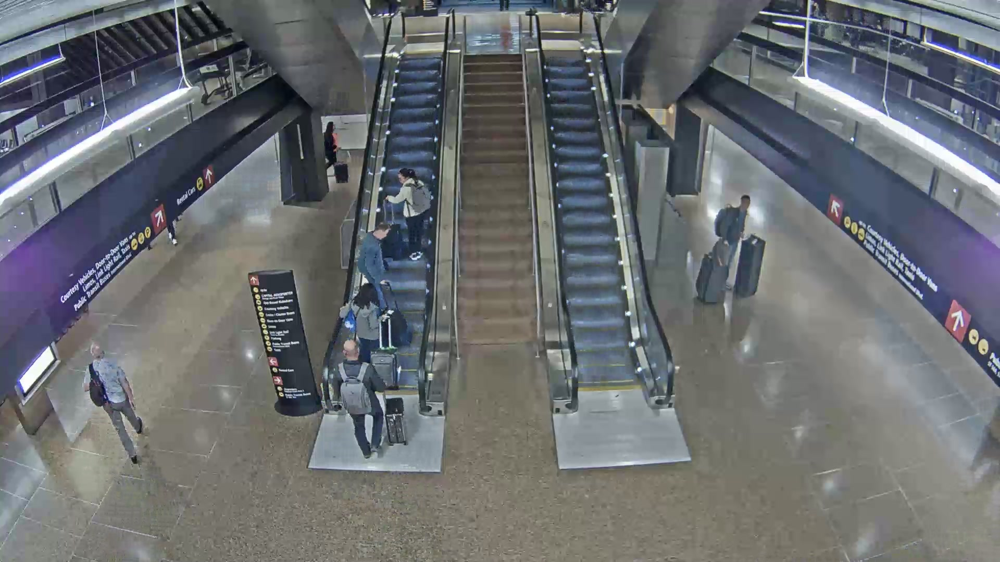

 ### __Issue:__ 

><p style="font-size: 16px"> There is an increasing amount of injuries sustained from the use of escalators at airports nationwide. At Seattle Tacoma (Sea-Tac) International Airport, there were 175 injuries from 2008 to 2014 on the airport's 79 escalators. Only three of the injuries were found to be from escalator malfunction. Closer inspection found that most of the injuries were sustained because of wheeled luggage being transported on the escalator.</p>  

> <p style="font-size: 16px">Escalator manufacturers state that wheeled luggage, such as suitcases, wheelchairs, and strollers are prohibited on the escalator. Currently, there are signs directing travelers to the nearest elevators around some escalators at Sea Tac. However, there are no signs that explicitly state that wheeled luggage is prohibited on the escalator.</p>


### __Data:__ 
> <p style="font-size: 16px">Security cameras are trained on the escalators, recording the events unfolding. The data set was collected by taking screenshots after every minute of the footage taken on March 20,2019 to March 21, 2019.</p>

### __Solution:__ 

> <p style="font-size: 16px">To efficiently warn travelers, computer vision and machine learning can be implemented.I used binary classification to train the model to recognize safe and unsafe images. To do this, the data set was sorted into two files: safe and unsafe. The model is fed safe and unsafe images with their coressponding label. After a certain amount of time, the model is able to recognize the pattern to correctly label images as safe or unsafe. </p> 

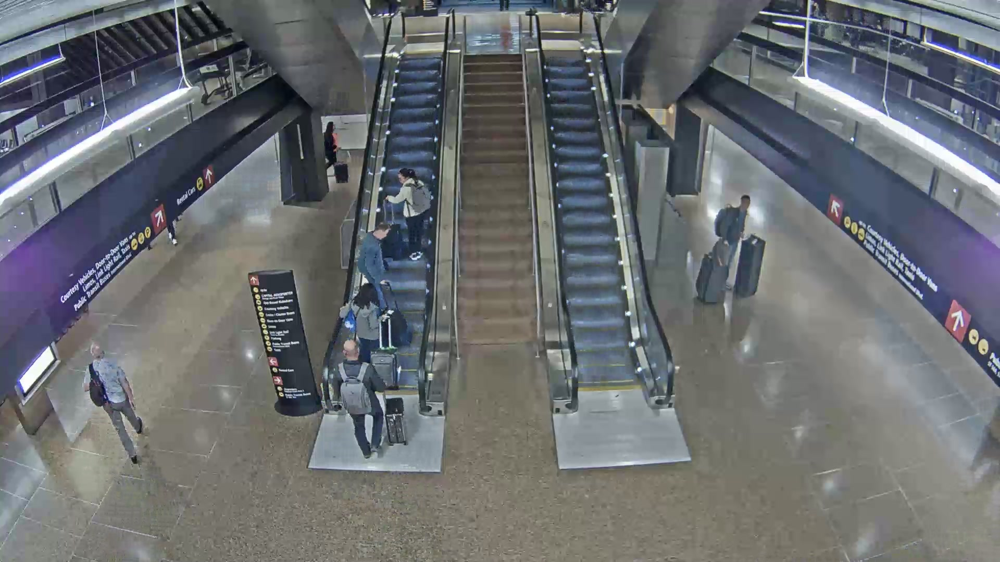


# Importing Libraries and Modules

### Main libraries used: 

- __keras:__ A high-level neural network API written in Python that can run on top of TensorFlow


- __numpy:__ A package for scientifict computing in Python. Specifically used as an array object


- __shutil:__ A module that helps copying files in an array to a new directory 


In [1]:
from __future__ import absolute_import, division, print_function, unicode_literals
import tensorflow as tf
from tensorflow import keras
print("TensorFLow version is",  tf.__version__)
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
import os
import glob
import shutil
from keras.preprocessing.image import ImageDataGenerator, load_img
from keras.utils import to_categorical
AUTOTUNE = tf.data.experimental.AUTOTUNE
keras.__version__

TensorFLow version is 1.13.1


Using TensorFlow backend.


'2.2.4-tf'

# Downloading the Data

> There are 1,907 safe images in our dataset compared to only 751 unsafe images. 
If we feed all these images to the machine learning algorithm, it will overfit, or will be more likely to classify images as safe than as unsafe. 
To combat this, I randomly selected 751 safe images to be part of the training dataset. 

In [2]:
#download the data

import pathlib
import random

#Where all sorted images are:
source_folder = pathlib.WindowsPath(r"C:\Users\FXZ708\Downloads\Sorted Escalators")

#empty arrays to store images
training_images = []
safe_file=[]
unsafe_file = []


#Randomly select 751 safe images out of 1,907 labeled safe images
safe_image_paths = list(source_folder.glob("safe/*")) #glob, or put all files into image_paths
safe_image_paths = [str(path) for path in safe_image_paths]# put all the file paths in image_paths
random.shuffle(safe_image_paths)# reshuffle the file paths, helps with training model better
random_safe_images= safe_image_paths[:751] #751 random safe images

#add all safe images to array
for i in range(len(random_safe_images)): 
    training_images.append(random_safe_images[i])
    safe_file.append(random_safe_images[i])
    
#Get files paths to all 751 unsafe images
unsafe_images = list(source_folder.glob("unsafe/*")) #glob, or put all files into image_paths
unsafe_images = [str(path) for path in unsafe_images]# put all the file paths in image_paths

#add all unsafe images to array
for i in range(len(unsafe_images)): 
    training_images.append(unsafe_images[i])
    unsafe_file.append(unsafe_images[i])
    
#check num. of photos in training_images (1502)
print(len(training_images)) 
print(training_images[0])
print(training_images[1])

In [3]:
# https://stackoverflow.com/questions/123198/how-do-i-copy-a-file-in-python

#source_folder has all sorted images, but our testing data doesn't include all of the sorted images
#need to move the images we picked for our test set into own directory called test_set

import shutil

#File paths of where images to be tested on will go 
destination_safe = r"C:\Users\FXZ708\Downloads\train_images\safe"
destination_unsafe = r"C:\Users\FXZ708\Downloads\train_images\unsafe"

#For loop takes images in each array and puts them into respective safe and unsafe files
for item in safe_file:
    shutil.copy(item, destination_safe)
    
for item in unsafe_file:
    shutil.copy(item, destination_unsafe)

# Creating Validation Set

1. Make a txt file based on images in the safe and unsafe files
>command prompt, cd downloads, cd train_images, cd safe, dir /b>list.txt
    
2. Use gitbash to randomly select 10% of data to create validation set 
>open gitbash, cd downloads, shuf -n N safelist.txt > newsafelist.txt
    
3. place randomly selected images into csv file


In [5]:
#read images in csv file into an array

import cv2

# 10% of images are validation set 

train= pd.read_csv(r'C:\Users\FXZ708\Downloads\_safe.csv')

train_unsafe= pd.read_csv(r'C:\Users\FXZ708\Downloads\_unsafe.csv')

images_safe_val=[]

images_unsafe_val=[]

for i in range(75):
      images_safe_val.append('C:/Users/FXZ708/Downloads/train_images/'+train['Labels'][i]+'//'+train['Images'][i])
        
for i in range(75):
    images_unsafe_val.append('C:/Users/FXZ708/Downloads/train_images/'+train_unsafe['Labels'][i]+'//'+train_unsafe['Images'][i])

In [6]:
print(images_safe_val[0])
print(images_unsafe_val[0])

In [7]:
# #copying safe and unsafe validation photos into own files 

import shutil

destination_safe_val = r"C:\Users\FXZ708\Downloads\train_val\safe val"

for item in images_safe_val:
    shutil.copy(item, destination_safe_val)

destination_unsafe_val = r"C:\Users\FXZ708\Downloads\train_val\unsafe val"

for item in images_unsafe_val:
    shutil.copy(item, destination_unsafe_val)

In [8]:
delete validation photos from safe and unsafe training images 

import os

for i in range(75):
    os.remove(images_safe_val[i])
    
for i in range(75):
    os.remove(images_unsafe_val[i])

# Creating a Dictionary

In [9]:
#looks at files in Sorted Escalator, makes them into a dictionary

source_folder = pathlib.WindowsPath(r"C:\Users\FXZ708\Downloads\Sorted Escalators")

labels = sorted(item.name for item in source_folder.glob("*/") if item.is_dir()) 
label_to_index = dict((name, index) for index, name in enumerate(labels))
print(label_to_index)

{'safe': 0, 'unsafe': 1}


In [10]:
#in file path for each image, renames Safe/ Unsafe to corresponding number 0 or 1
# labels = np.array([label_to_index[pathlib.Path(path).parent.name] for path in image_paths])
# error: issues with capitalization and lowercase of files names, so used .lower() to make all files names lowercase

labels = np.array([label_to_index[pathlib.Path(path.lower()).parent.name] for path in training_images])

In [11]:
#number of files 
labels.shape 

(1352,)

In [12]:
#https://blog.keras.io/building-powerful-image-classification-models-using-very-little-data.html

# Layers 

> The model starts with two fully connected layers followed by three convolutional layers with a ReLU activation and max-pooling layers. After that, there is a sigmoid activation and use of binary_crossentropy to measure loss as the model is training. Dropout is included in the model as it ensures each layer won’t see the same pattern twice, preventing overfitting.

In [13]:
from keras.models import Sequential
from keras.layers import Conv2D, MaxPooling2D
from keras.layers import Activation, Dropout, Flatten, Dense

model=Sequential()
model.add(Conv2D(32,(3,3), input_shape=(150,150,3)))
model.add(Activation('relu'))
model.add(MaxPooling2D(pool_size=(2, 2)))

model.add(Conv2D(32, (3, 3)))
model.add(Activation('relu'))
model.add(MaxPooling2D(pool_size=(2, 2)))

model.add(Conv2D(64, (3, 3)))
model.add(Activation('relu'))
model.add(MaxPooling2D(pool_size=(2, 2)))

Instructions for updating:
Colocations handled automatically by placer.


In [14]:
model.add(Flatten())  # this converts our 3D feature maps to 1D feature vectors
model.add(Dense(64))
model.add(Activation('relu'))
model.add(Dropout(0.5))
model.add(Dense(1))
model.add(Activation('sigmoid'))

model.compile(loss='binary_crossentropy',
              optimizer='rmsprop',
              metrics=['accuracy'])

Instructions for updating:
Please use `rate` instead of `keep_prob`. Rate should be set to `rate = 1 - keep_prob`.


In [15]:
model.summary()

_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv2d_1 (Conv2D)            (None, 148, 148, 32)      896       
_________________________________________________________________
activation_1 (Activation)    (None, 148, 148, 32)      0         
_________________________________________________________________
max_pooling2d_1 (MaxPooling2 (None, 74, 74, 32)        0         
_________________________________________________________________
conv2d_2 (Conv2D)            (None, 72, 72, 32)        9248      
_________________________________________________________________
activation_2 (Activation)    (None, 72, 72, 32)        0         
_________________________________________________________________
max_pooling2d_2 (MaxPooling2 (None, 36, 36, 32)        0         
_________________________________________________________________
conv2d_3 (Conv2D)            (None, 34, 34, 64)        18496     
__________

# Preproccesing the Data

> The pictures are augmented through Image Data Generator to help prevent overfitting. Overfitting is when the model is fed too few images, and starts classifying on trivial patterns it sees.  By randomly rotating, shifting, flipping, and rescaling the images, it is ensured the model will never see the same picture twice and be less likely to overfit.


- __Rescale:__ The origial photos consist of RGB values from 0-255, but our model can't process values this high. So, we divide by 255 so the values are between 0-1


- __Zoom Range:__ randomly zooming into pictures 


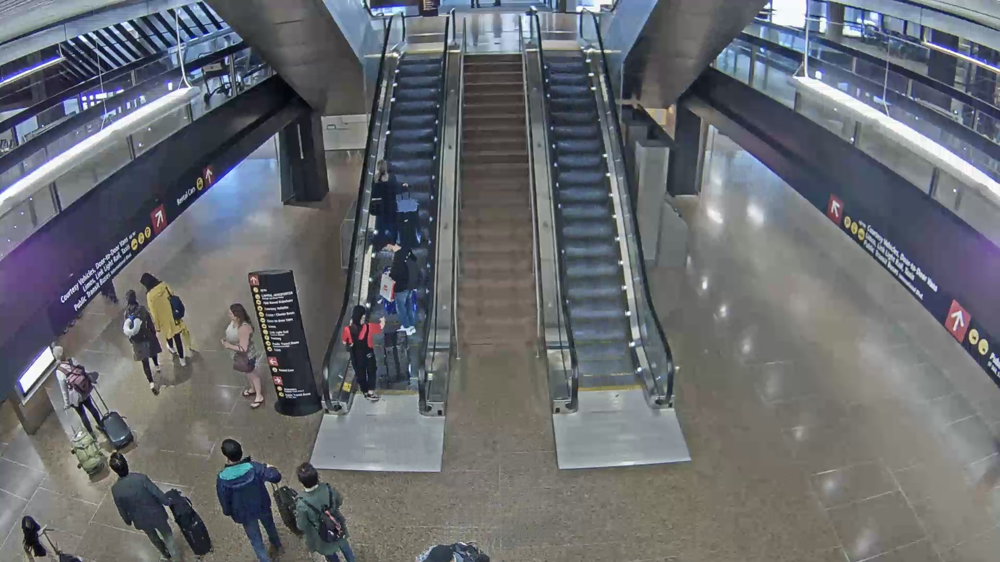

In [16]:
#preprocessing the same image (above) 10 times to see the effects of Image Data Generator

from keras.preprocessing.image import ImageDataGenerator, array_to_img, img_to_array, load_img
import pathlib

datagen = ImageDataGenerator(
        rescale=1./255,
        shear_range=0.2,
        zoom_range=0.2,
        horizontal_flip=True)


preview_folder = pathlib.WindowsPath(r"C:\Users\FXZ708\Downloads\preview")

img = load_img(r'C:\Users\FXZ708\Downloads\train_images\unsafe\escalator_074.jpg')  # this is a PIL image
x = img_to_array(img)  # this is a Numpy array with shape (3, 150, 150)
x = x.reshape((1,) + x.shape)  # this is a Numpy array with shape (1, 3, 150, 150)


# the .flow() command below generates batches of randomly transformed images
# and saves the results to the `preview/` directory
i = 0
for batch in datagen.flow(x, batch_size=1,
                          save_to_dir=preview_folder):
    i += 1
    if i > 10:
        break  # otherwise the generator would loop indefinitely

Populating the interactive namespace from numpy and matplotlib


C:\Users\FXZ708\AppData\Local\Continuum\miniconda3\lib\site-packages\IPython\core\magics\pylab.py:160: UserWarning: pylab import has clobbered these variables: ['random']
`%matplotlib` prevents importing * from pylab and numpy
  "\n`%matplotlib` prevents importing * from pylab and numpy"


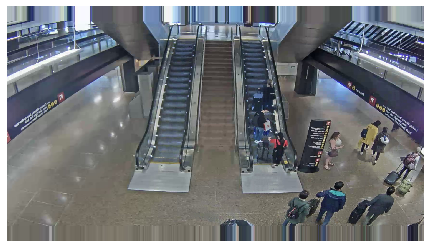

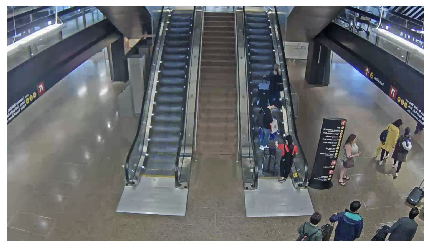

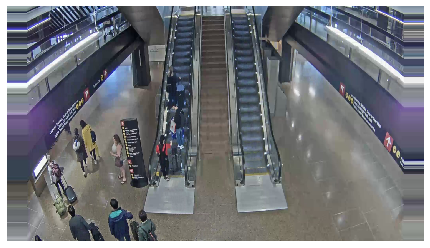

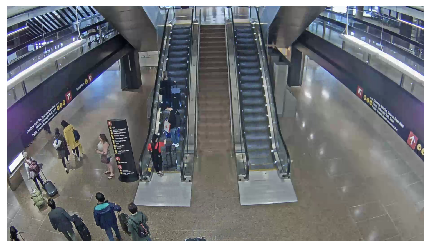

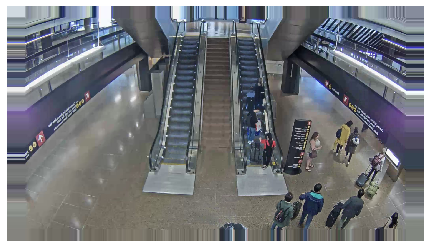

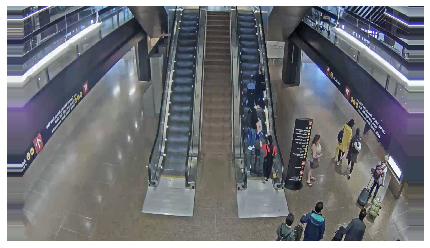

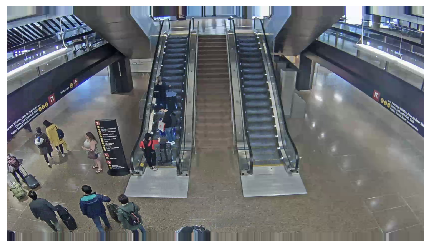

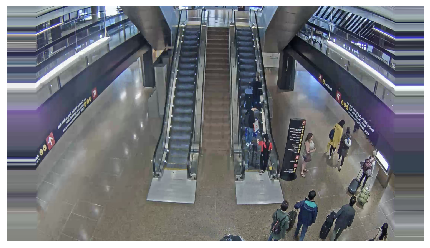

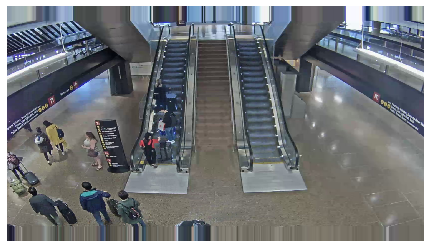

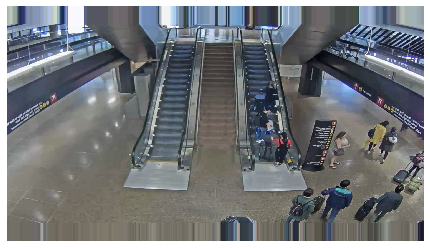

In [17]:
%pylab inline

import matplotlib.pyplot as plt

import matplotlib.image as mpimg

import cv2

for i in range(10):
    img = mpimg.imread('Downloads/preview/'+ str((i+1))+ '.png')
    plt.figure(figsize= (25,25))
    plt.subplot(5,2,i+1)
    imgplot= plt.imshow(img)
    plt.axis("off")
    plt.show()

# Creating Batches of Image Data

> .flow_from_directory() generates batches directly from the files they are stored in

In [18]:
from keras.preprocessing.image import ImageDataGenerator

batch_size = 16

#augments the pictures
train_datagen = ImageDataGenerator(
        rescale=1./255,
        shear_range=0.2,
        zoom_range=0.2,
        horizontal_flip=True)

# rescales the images
test_datagen = ImageDataGenerator(rescale=1./255)


#Will read pictures found in specified folders are create batches of augmented image data

directory= (r"C:\Users\FXZ708\Downloads\train_images")
directory_val= (r"C:\Users\FXZ708\Downloads\train_val")

train_generator = train_datagen.flow_from_directory(
        directory,  # this is the target directory
        target_size=(150, 150),  # all images will be resized to 150x150
        batch_size=batch_size,
        class_mode='binary')  # since we use binary_crossentropy loss, we need binary labels

validation_generator = test_datagen.flow_from_directory(
        directory_val,
        target_size=(150, 150),
        batch_size=batch_size,
        class_mode='binary')

Found 1352 images belonging to 2 classes.
Found 150 images belonging to 2 classes.


# Training the Model

> model.fit_generator is used to train the model. It is fed the training images to learn the patterns that imply safe and unsafe situations. The validation set is used to test the accuracy of the model.  

# Running with 35 Epochs



In [19]:
model.fit_generator(
        train_generator,
        steps_per_epoch=2000// batch_size,
        epochs=35,
        validation_data=validation_generator,
        validation_steps=800 // batch_size)
model.save_weights('thirtyfive_weights.h5')

Instructions for updating:
Use tf.cast instead.
Epoch 1/35
125/125 [==============================] - 206s 2s/step - loss: 0.7872 - acc: 0.5050 - val_loss: 1.1472 - val_acc: 0.5000
Epoch 2/35
125/125 [==============================] - 191s 2s/step - loss: 0.6765 - acc: 0.5995 - val_loss: 0.6129 - val_acc: 0.6933
Epoch 3/35
125/125 [==============================] - 181s 1s/step - loss: 0.5739 - acc: 0.6685 - val_loss: 0.7374 - val_acc: 0.6733
Epoch 4/35
125/125 [==============================] - 187s 1s/step - loss: 0.5492 - acc: 0.6750 - val_loss: 0.4800 - val_acc: 0.7067
Epoch 5/35
125/125 [==============================] - 191s 2s/step - loss: 0.5435 - acc: 0.6870 - val_loss: 0.7129 - val_acc: 0.6867
Epoch 6/35
125/125 [==============================] - 185s 1s/step - loss: 0.5248 - acc: 0.6965 - val_loss: 0.5935 - val_acc: 0.7000
Epoch 7/35
125/125 [==============================] - 187s 1s/step - loss: 0.5312 - acc: 0.7170 - val_loss: 0.4856 - val_acc: 0.7067
Epoch 8/35
125/125 [=

In [20]:
model.save('thirtyfive.h5')

C:\Users\FXZ708\Downloads\train_val\safe val\escalator_2295.jpg
THE FOLLOWING PICTURES ARE CLASSIFIED AS SAFE


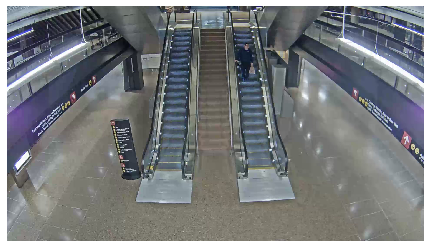

[[0]]


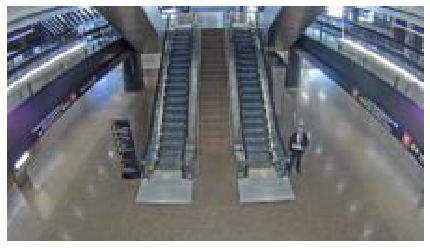

[[0]]


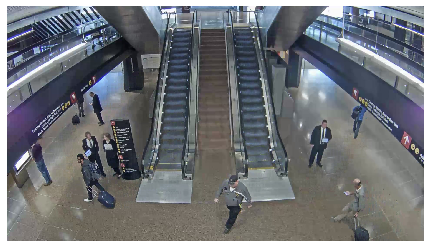

[[0]]


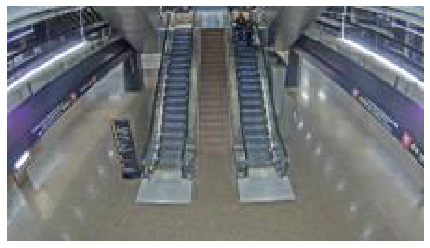

[[0]]


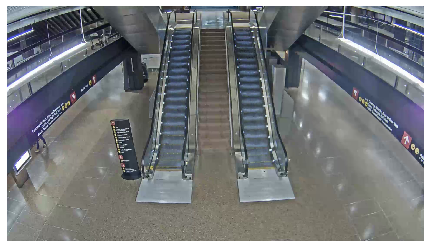

[[0]]
C:\Users\FXZ708\Downloads\train_val\unsafe val\escalator_448.jpg
THE FOLLOWING PICTURES ARE CLASSIFIED AS UNSAFE


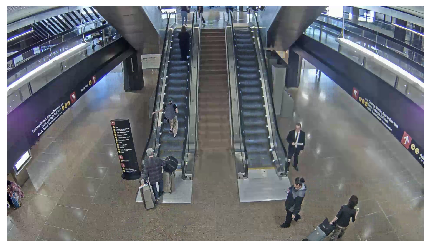

[[1]]


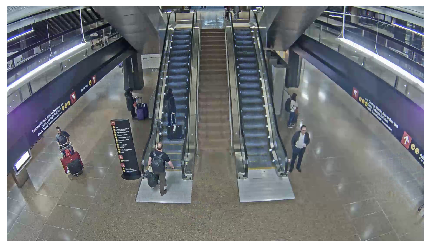

[[1]]


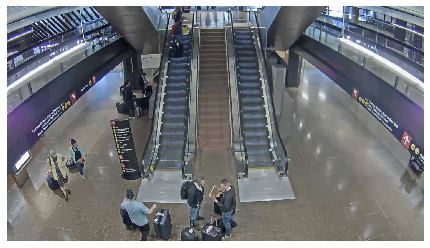

[[1]]


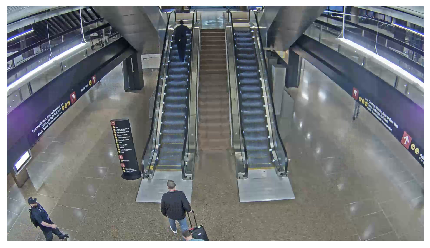

[[1]]


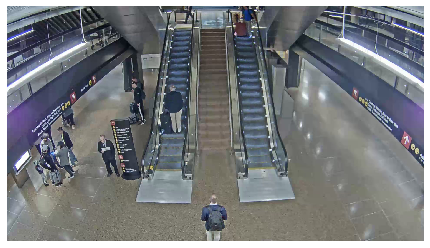

[[1]]


In [21]:
#https://stackoverflow.com/questions/43469281/how-to-predict-input-image-using-trained-model-in-keras

from keras.models import load_model
import cv2
import numpy as np
import pathlib
import random

model= load_model('thirtyfive.h5')

val_images= pathlib.WindowsPath(r"C:\Users\FXZ708\Downloads\train_val")

val_safe= list(val_images.glob("safe val/*"))
val_safe_paths= [str(path) for path in val_safe]
random.shuffle(val_safe_paths)

print(val_safe_paths[0])

# img1=mpimg.imread(val_safe_paths[0])
# imgplot= plt.imshow(img1)
# plt.show

print("THE FOLLOWING PICTURES ARE CLASSIFIED AS SAFE")

for i in range(5):
    img=mpimg.imread(val_safe_paths[i])
    plt.figure(figsize= (25,25))
    plt.subplot(5,2,i+1)
    imgplot= plt.imshow(img)
    plt.axis("off")
    plt.show()
    img=cv2.imread(val_safe_paths[i])
    img= cv2.resize(img,(150,150))
    img=np.reshape(img,[1,150,150,3])
    classes= model.predict_classes(img)
    print(classes)
    
val_images= pathlib.WindowsPath(r"C:\Users\FXZ708\Downloads\train_val")

val_unsafe= list(val_images.glob("unsafe val/*"))
val_unsafe_paths= [str(path) for path in val_unsafe]
random.shuffle(val_unsafe_paths)
print(val_unsafe_paths[0])

print("THE FOLLOWING PICTURES ARE CLASSIFIED AS UNSAFE")

for i in range(5):
    img=mpimg.imread(val_unsafe_paths[i])
    plt.figure(figsize= (25,25))
    plt.subplot(5,2,i+1)
    imgplot= plt.imshow(img)
    plt.axis("off")
    plt.show()
    img=cv2.imread(val_unsafe_paths[i])
    img= cv2.resize(img,(150,150))
    img=np.reshape(img,[1,150,150,3])
    classes= model.predict_classes(img)
    print(classes)

# How to Increase Accuracy
- ### Training on the COCO dataset
> <p style="font-size: 16px">I'm currently working on training my neural network on images like people, suitcases, and backpacks from the COCO dataset. So, before the network sees the escalator images, it will already be able to recognize these objects.</p>
- ### More data
> <p style="font-size: 16px"> The training dataset only contains 1,502 images,all taken on the same day, which is not enough to display all safe and unsafe circumstances. More data will make the convoutional neural network (CNN) more precise</p>
- ### Cropping to only show the escalator and the immediate area around it
> <p style="font-size: 16px"> By focusing on a more specific area, the CNN might pick up the patterns for safe and unsafe more quickly</p>
- ### Different escalators in different settings
> <p style="font-size: 16px"> Train the CNN on images from different escalators in the airport, or escalators not on the airports property. This will make the CNN more versatile </p>

# Implementation
- ### There are several ways to warn travelers if the CNN detects an unsafe situation. 

><p style="font-size: 16px"> First, a sign directing travelers with wheeled luggage to the closest elevators can light up. </p>

><p style="font-size: 16px"> Or, there can be an overhead message explaining wheeled luggage is prohibited on the escalators.</p>

### __Takeaway:__ 

> <p style="font-size: 16px">I came into this internship with a basic understanding of machine learning, and no experience coding with Python. Through the help of my  amazing supervisor and teammates, I learned essential skills that will stay with me through my programming career.</p> 

> <p style="font-size: 16px">The first two weeks of the internship I was given the opportunity to learn in-depth about machine learning. I watched countless videos and followed many tutorials. Through this experience, I learned how to self-teach myself new coding material.</p> 

> <p style="font-size: 16px">On top of that, I learned how to code with Python. There was a huge learning curve, and lots of trial and error, but now I can add another coding language to my toolbelt.</p> 

> <p style="font-size: 16px">Finally, I experienced what is is like to work in a professional setting. Interning at Port of Seattle gave me many opportunities to reach out to many people working at ICT, who gave me enriching career advice.</p>


Sources: 
https://blog.keras.io/building-powerful-image-classification-models-using-very-little-data.html

https://stackoverflow.com/questions/43469281/how-to-predict-input-image-using-trained-model-in-keras